# VGG16 — Partial Fine-Tuning  
**Phase 1: Baseline Evaluation**  
This notebook evaluates the VGG16 model with partial fine-tuning applied (classifier[3] & classifier[6]). 

VGG16: 16,986,162 / 134,465,394 parameters trainable (12.6%)


Epoch 1/5: 100%|██████████| 225/225 [33:45<00:00,  9.00s/it]


Epoch 1: Train Acc: 73.85%, Val Acc: 88.80%


Epoch 2/5: 100%|██████████| 225/225 [30:07<00:00,  8.03s/it]


Epoch 2: Train Acc: 85.20%, Val Acc: 88.80%


Epoch 3/5: 100%|██████████| 225/225 [27:44<00:00,  7.40s/it]


Epoch 3: Train Acc: 88.17%, Val Acc: 90.80%


Epoch 4/5: 100%|██████████| 225/225 [24:50<00:00,  6.62s/it]


Epoch 4: Train Acc: 90.21%, Val Acc: 92.00%


Epoch 5/5: 100%|██████████| 225/225 [29:23<00:00,  7.84s/it]


Epoch 5: Train Acc: 91.16%, Val Acc: 89.20%


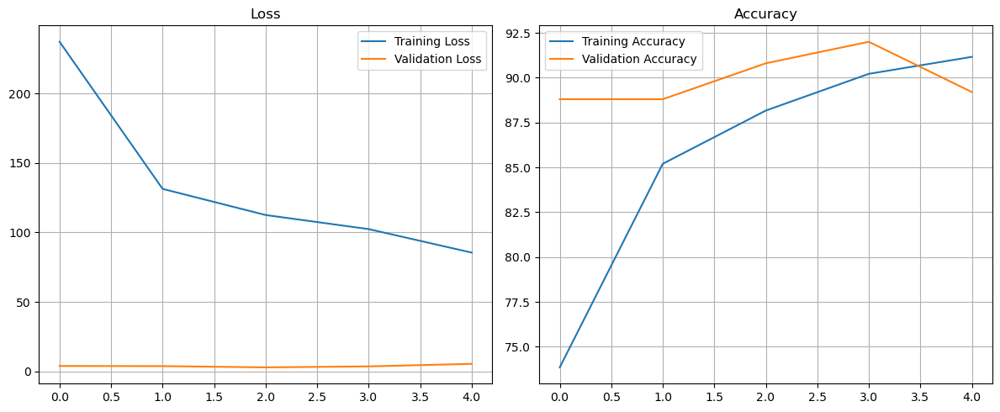

Test Accuracy: 92.80%
Classification Report:
                           precision    recall  f1-score   support

     ARCIGERA FLOWER MOTH       1.00      1.00      1.00         5
               ATLAS MOTH       1.00      1.00      1.00         5
        BANDED TIGER MOTH       0.62      1.00      0.77         5
  BIRD CHERRY ERMINE MOTH       1.00      1.00      1.00         5
        BLACK RUSTIC MOTH       1.00      1.00      1.00         5
             BLAIRS MOCHA       1.00      0.80      0.89         5
    BLOTCHED EMERALD MOTH       0.62      1.00      0.77         5
BLUE BORDERED CARPET MOTH       0.83      1.00      0.91         5
            CINNABAR MOTH       0.83      1.00      0.91         5
           CLEARWING MOTH       0.83      1.00      0.91         5
               COMET MOTH       1.00      1.00      1.00         5
    DEATHS HEAD HAWK MOTH       1.00      1.00      1.00         5
       ELEPHANT HAWK MOTH       1.00      0.80      0.89         5
         EMPEROR

In [ ]:
# Import necessary packages
# Core imports
from pathlib import Path
import os

# Numerics
import numpy as np

# Plotting (for training/validation curves)
import matplotlib.pyplot as plt

# PyTorch
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader

# Torchvision
from torchvision import datasets, models
from torchvision.models import VGG16_Weights

# Progress bar (for training loop)
from tqdm import tqdm

# Evaluation metrics
from sklearn.metrics import classification_report, confusion_matrix

# Device - tells PyTorch code to automatically select GPU if available, otherwise use CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define Paths
data_root = Path("../data/kaggle-dataset/archive")

# Transforms - loads default pretrained weights for VGG16 (trained on ImageNet)
weights = VGG16_Weights.DEFAULT
transform = weights.transforms()

# Dictionary-style dataset and dataloader setup
data_transforms = {
    'train': transform,
    'valid': transform,
    'test': transform
}

image_datasets = {
    split: datasets.ImageFolder(os.path.join(data_root, split), transform=data_transforms[split])
    for split in ['train', 'valid', 'test']
}

dataloaders = {
    split: DataLoader(image_datasets[split], batch_size=32, shuffle=(split == 'train'), num_workers=4)
    for split in ['train', 'valid', 'test']
}

class_names = image_datasets['train'].classes
num_classes = len(class_names)

# VGG16 partial fine-tuning
model = models.vgg16(weights=weights)
model.classifier[6] = nn.Linear(model.classifier[6].in_features, num_classes)

# Freeze all parameters
for param in model.parameters():
    param.requires_grad = False

# Unfreeze classifier[3] + classifier[6]
for param in model.classifier[3].parameters():  
    param.requires_grad = True
for param in model.classifier[6].parameters():  
    param.requires_grad = True

# Check parameters
trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
total = sum(p.numel() for p in model.parameters())
print(f"VGG16: {trainable:,} / {total:,} parameters trainable ({100*trainable/total:.1f}%)")

model.to(device)

# Loss and optimiser for calculating error and adjusting for model improvement
criterion = nn.CrossEntropyLoss()
optimiser = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=1e-3, weight_decay=1e-4)

# Training
train_loss_list, val_loss_list = [], []
train_acc_list, val_acc_list = [], []
epochs = 5

for epoch in range(epochs):
    model.train()
    total_loss, total_correct, total_samples = 0, 0, 0

    for x, y in tqdm(dataloaders['train'], desc=f"Epoch {epoch+1}/{epochs}"):
        x, y = x.to(device), y.to(device)
        optimiser.zero_grad()
        output = model(x)
        loss = criterion(output, y)
        loss.backward()
        optimiser.step()

        total_loss += loss.item()
        total_correct += (output.argmax(1) == y).sum().item()
        total_samples += y.size(0)

    train_loss_list.append(total_loss)
    train_acc_list.append(100 * total_correct / total_samples)

    model.eval()
    val_loss, val_correct, val_total = 0, 0, 0
    with torch.no_grad():
        for x, y in dataloaders['valid']:
            x, y = x.to(device), y.to(device)
            output = model(x)
            loss = criterion(output, y)
            val_loss += loss.item()
            val_correct += (output.argmax(1) == y).sum().item()
            val_total += y.size(0)

    val_loss_list.append(val_loss)
    val_acc_list.append(100 * val_correct / val_total)

    print(f"Epoch {epoch+1}: Train Acc: {train_acc_list[-1]:.2f}%, Val Acc: {val_acc_list[-1]:.2f}%")

# Plot
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(train_loss_list, label="Training Loss")
plt.plot(val_loss_list, label="Validation Loss")
plt.legend()
plt.title("Loss")
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(train_acc_list, label="Training Accuracy")
plt.plot(val_acc_list, label="Validation Accuracy")
plt.legend()
plt.title("Accuracy")
plt.grid(True)

plt.tight_layout()
plt.show()

# Test evaluation
model.eval()
all_preds, all_labels = [], []
test_correct, test_total = 0, 0

with torch.no_grad():
    for x, y in dataloaders['test']:
        x, y = x.to(device), y.to(device)
        output = model(x)
        pred = output.argmax(1)
        all_preds.extend(pred.cpu().numpy())
        all_labels.extend(y.cpu().numpy())
        test_correct += (pred == y).sum().item()
        test_total += y.size(0)

print(f"Test Accuracy: {100 * test_correct / test_total:.2f}%")
print("Classification Report:")
print(classification_report(all_labels, all_preds, target_names=class_names))

# Confused pairs
cm = confusion_matrix(all_labels, all_preds)
cm_copy = cm.copy()
np.fill_diagonal(cm_copy, 0)
confused = np.argwhere(cm_copy > 0)

print("Confused Class Pairs:")
for i, (true, pred) in enumerate(confused):
    count = cm[true, pred]
    print(f"{i+1}. True: {class_names[true]} ↔ Pred: {class_names[pred]} ({count} times)")


## Visualising Confused Pairs  

Confused species pairs identified from the confusion matrix are visualised below. For each pair, example images from the true class (top row) and the predicted class (bottom row) are displayed side by side to illustrate morphological similarities that may have led to misclassification. 

In [1]:
# Imports for visualisation
from pathlib import Path
import random
import matplotlib.pyplot as plt
from PIL import Image

def show_confused_species(dataset_dir, confused_pairs, n_samples=3):
    """
    Display sample images of species the model confused with one another.
    """
    test_dir = Path(dataset_dir) / "test"

    for true_class, pred_class in confused_pairs:
        print(f"\nConfused: '{true_class}' predicted as '{pred_class}'")
        fig, axes = plt.subplots(2, n_samples, figsize=(n_samples * 3, 5))

        for row, class_name in enumerate([true_class, pred_class]):
            imgs = list((test_dir / class_name).glob("*"))
            samples = random.sample(imgs, min(n_samples, len(imgs)))
            for i, ax in enumerate(axes[row]):
                if i < len(samples):
                    ax.imshow(Image.open(samples[i]))
                    ax.set_title(class_name, fontsize=9)
                ax.axis("off")

        plt.suptitle(f"'{true_class}' ↔ '{pred_class}'", fontsize=12)
        plt.tight_layout()
        plt.show()


Confused: 'BLAIRS MOCHA' predicted as 'LACE BORDER MOTH'


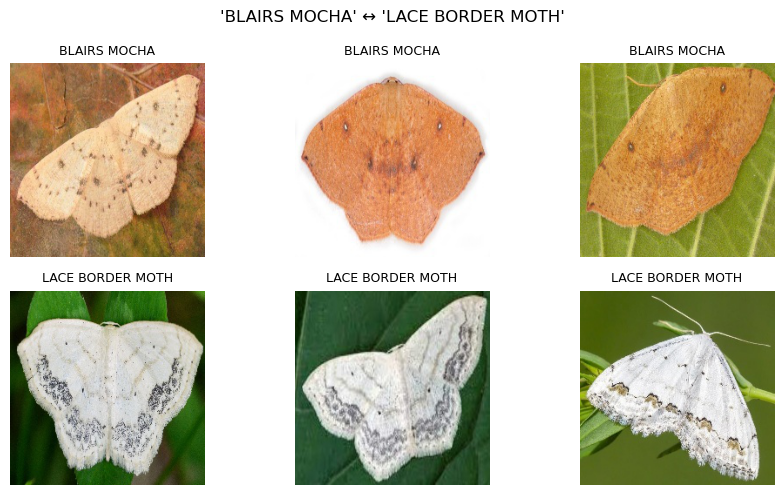


Confused: 'ELEPHANT HAWK MOTH' predicted as 'ROSY MAPLE MOTH'


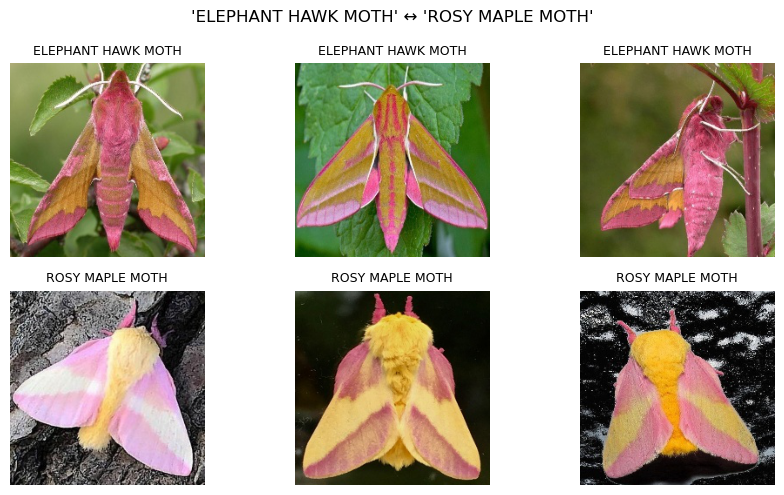


Confused: 'EYED HAWK MOTH' predicted as 'OLEANDER HAWK MOTH'


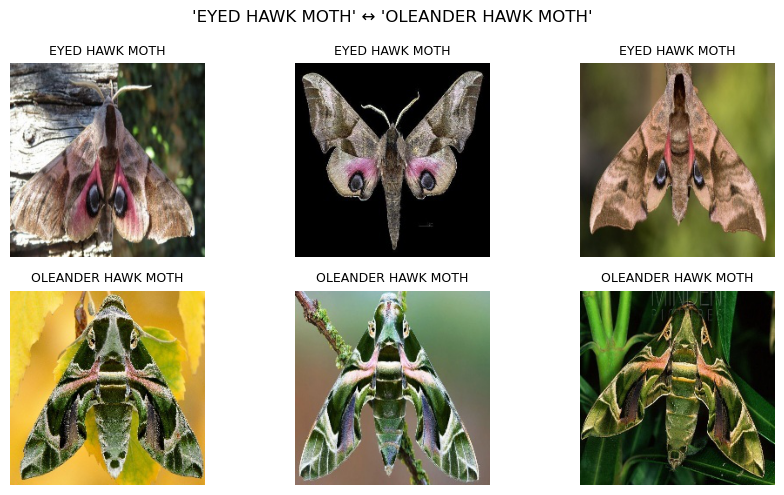


Confused: 'GARDEN TIGER MOTH' predicted as 'BANDED TIGER MOTH'


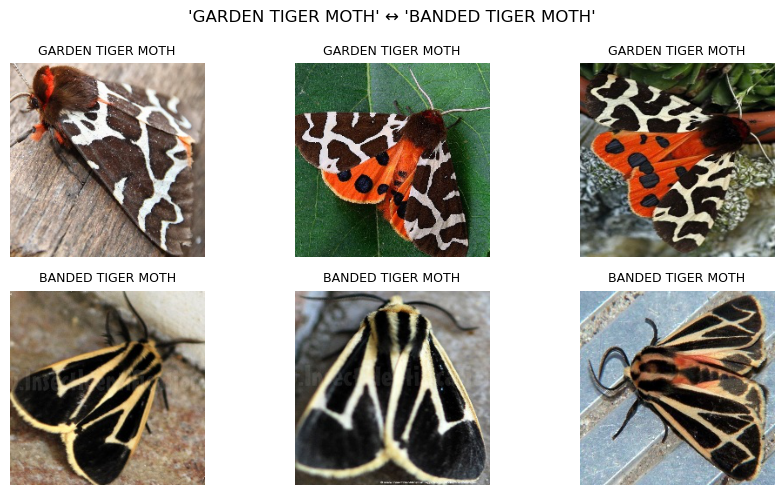


Confused: 'HORNET MOTH' predicted as 'CLEARWING MOTH'


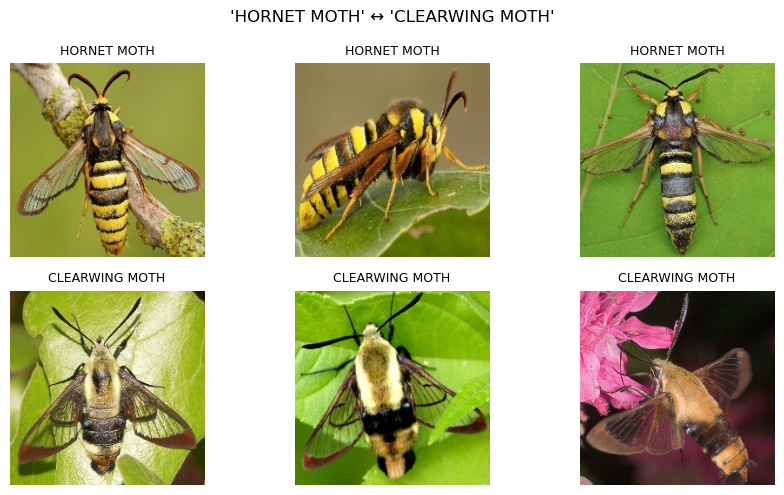


Confused: 'HORNET MOTH' predicted as 'FIERY CLEARWING MOTH'


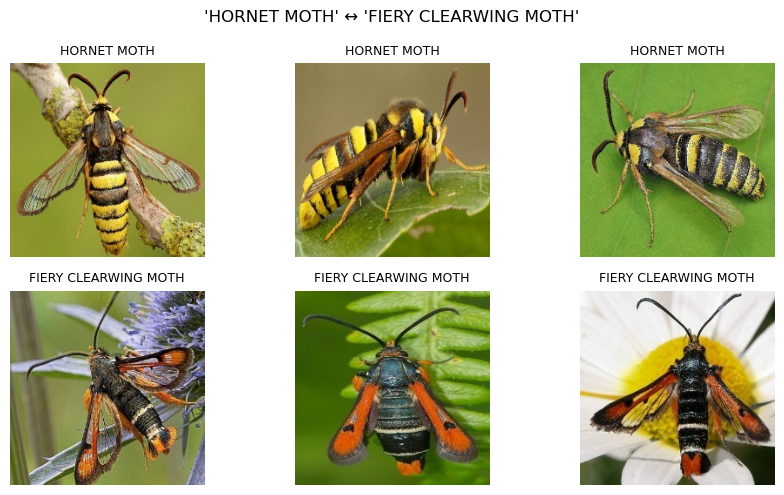


Confused: 'HUMMING BIRD HAWK MOTH' predicted as 'ROSY UNDERWING MOTH'


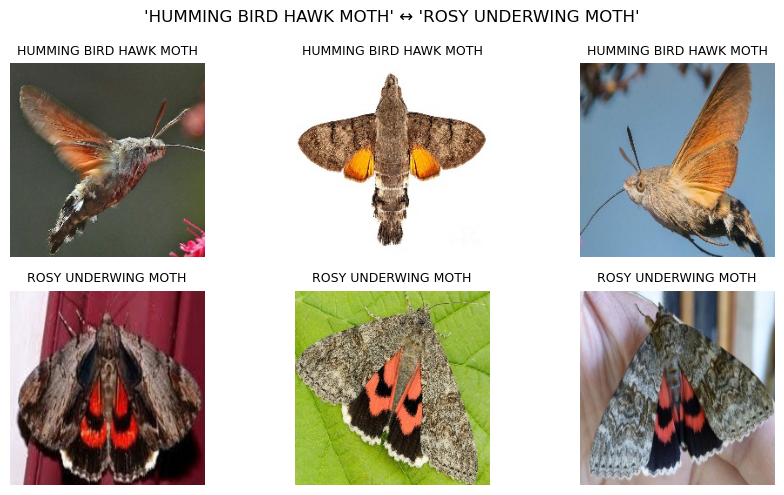


Confused: 'JULY BELLE MOTH' predicted as 'SQUARE SPOT RUSTIC MOTH'


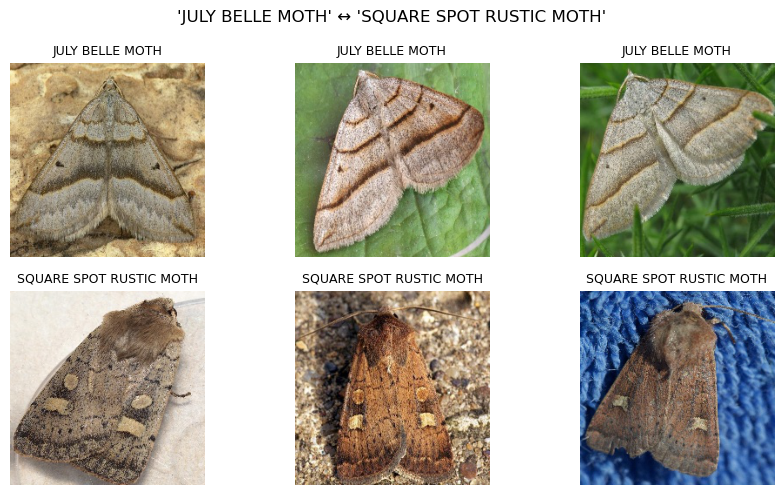


Confused: 'PLUME MOTH' predicted as 'BLOTCHED EMERALD MOTH'


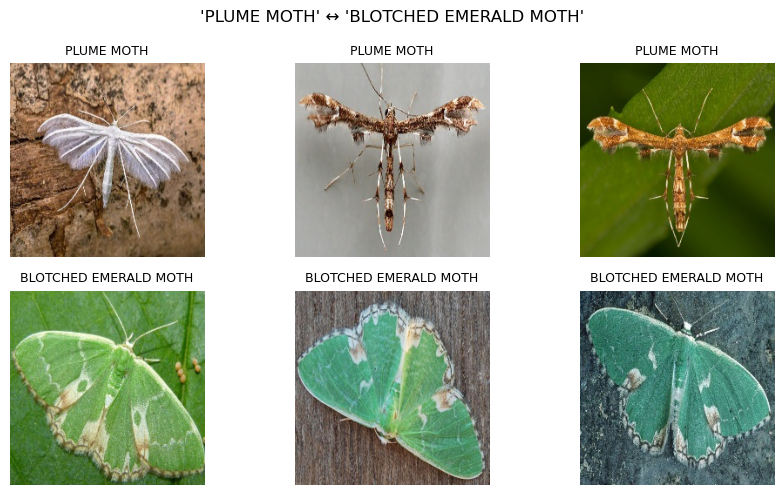


Confused: 'POLYPHEMUS MOTH' predicted as 'EMPEROR GUM MOTH'


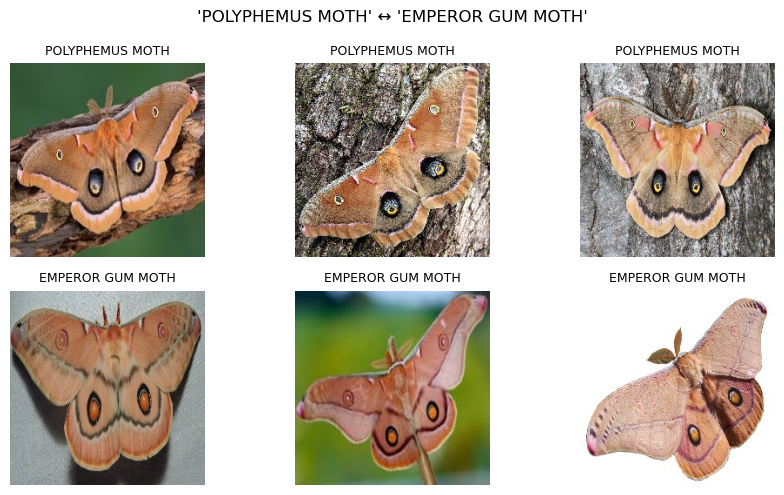


Confused: 'PURPLE BORDERED GOLD MOTH' predicted as 'ROSY MAPLE MOTH'


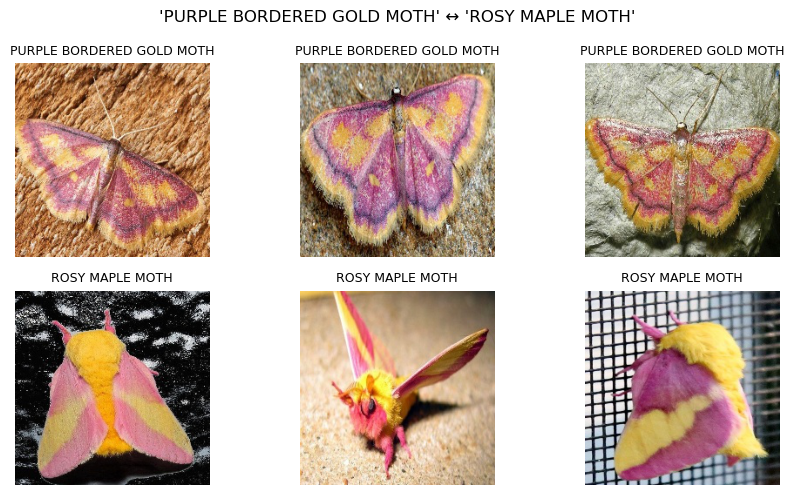


Confused: 'RED NECKED FOOTMAN MOTH' predicted as 'CINNABAR MOTH'


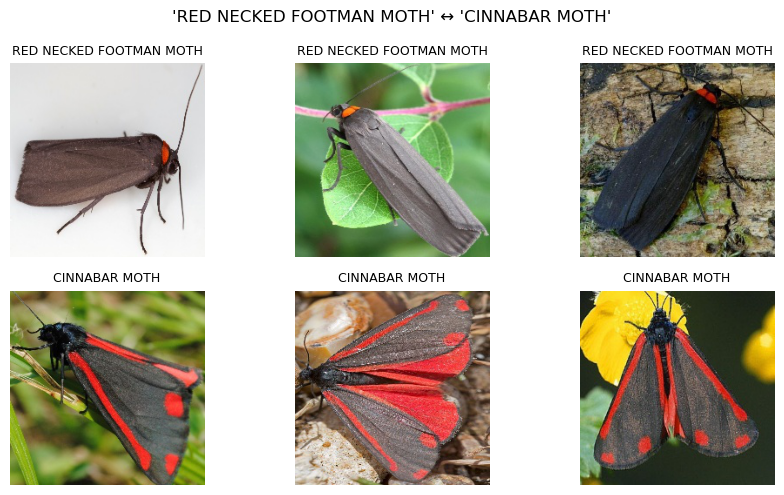


Confused: 'RUSTY DOT PEARL MOTH' predicted as 'SQUARE SPOT RUSTIC MOTH'


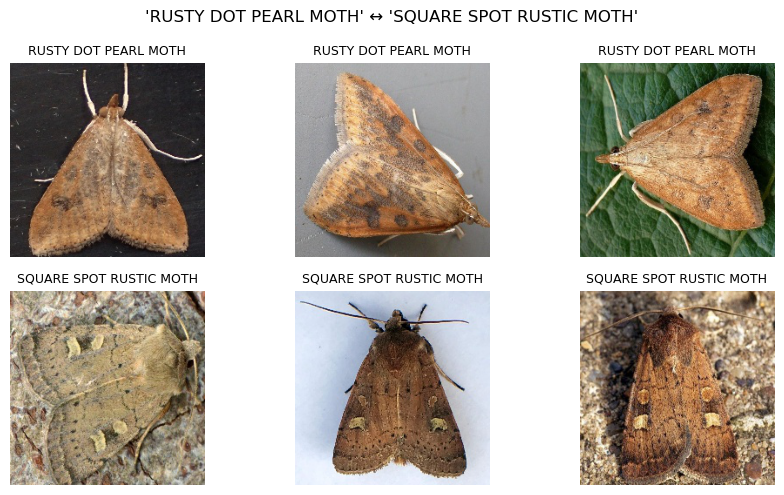


Confused: 'SUSSEX EMERALD MOTH' predicted as 'BLOTCHED EMERALD MOTH'


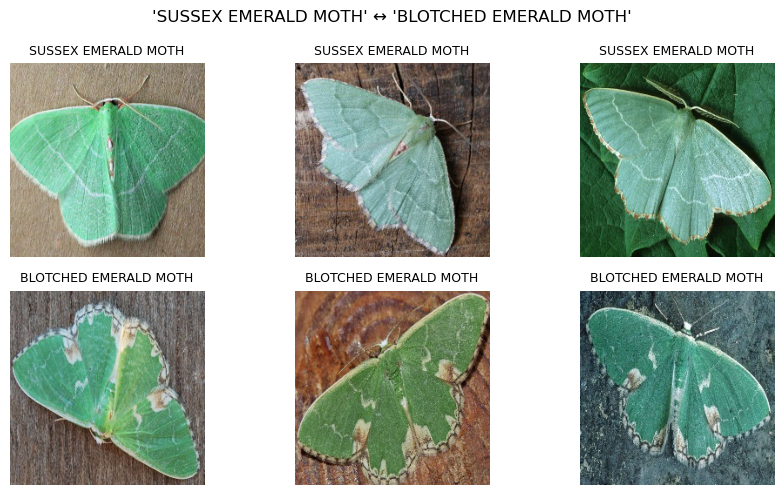


Confused: 'WHITE SPOTTED SABLE MOTH' predicted as 'BLUE BORDERED CARPET MOTH'


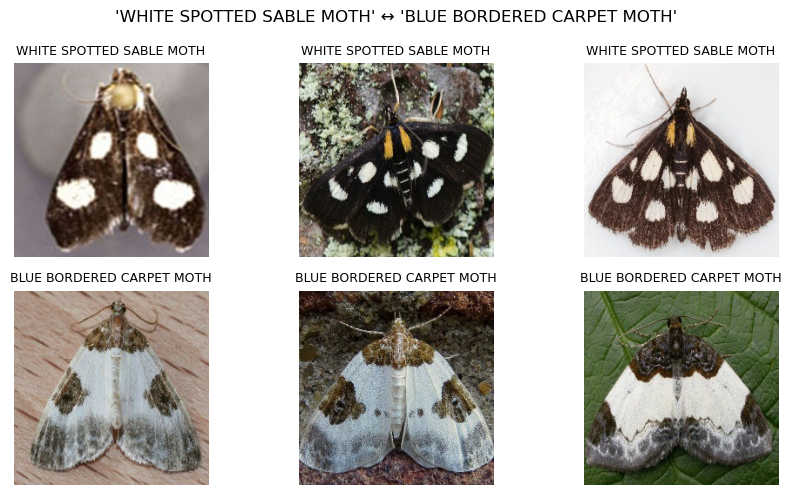

In [2]:
# Define confused class pairs based on the confusion matrix output
confused_pairs_to_plot = [
    ("BLAIRS MOCHA", "LACE BORDER MOTH"),
    ("ELEPHANT HAWK MOTH", "ROSY MAPLE MOTH"),
    ("EYED HAWK MOTH", "OLEANDER HAWK MOTH"),
    ("GARDEN TIGER MOTH", "BANDED TIGER MOTH"),
    ("HORNET MOTH", "CLEARWING MOTH"),
    ("HORNET MOTH", "FIERY CLEARWING MOTH"),
    ("HUMMING BIRD HAWK MOTH", "ROSY UNDERWING MOTH"),
    ("JULY BELLE MOTH", "SQUARE SPOT RUSTIC MOTH"),
    ("PLUME MOTH", "BLOTCHED EMERALD MOTH"),
    ("POLYPHEMUS MOTH", "EMPEROR GUM MOTH"),
    ("PURPLE BORDERED GOLD MOTH", "ROSY MAPLE MOTH"),
    ("RED NECKED FOOTMAN MOTH", "CINNABAR MOTH"),
    ("RUSTY DOT PEARL MOTH", "SQUARE SPOT RUSTIC MOTH"),
    ("SUSSEX EMERALD MOTH", "BLOTCHED EMERALD MOTH"),
    ("WHITE SPOTTED SABLE MOTH", "BLUE BORDERED CARPET MOTH")
]

# Call the visualisation function
show_confused_species("../data/kaggle-dataset/archive", confused_pairs_to_plot)
